In [2]:
# You will need to install the sinter, stim, matplotlib, pymatching, and numpy packages!
# Check the STIM Getting Started guide for specific package version dependencies (as there are some specific versions of these that STIM requires)

import stim
import sinter
import pymatching
import math
import matplotlib.pyplot as plt
import numpy as np

# These should be default packages!
import os
from typing import List
from pprint import pprint as pp
from collections import OrderedDict


plt.ion()

# This python script contains some modified IBM Repition Surface Code that allows you to specify a (at least for the moment) a single qubit and individually set it's defect rate
import sigma_noise_qubit_surface_code_generator as scg

In [25]:
def round_to_sig_figs(num, sig_figs):
    if num == 0: 
        return 0
    factor = 10**(sig_figs - 1 - int(math.floor(math.log10(abs(num)))))
    return round(num * factor) / factor

def count_logical_errors(circuit: stim.Circuit, num_shots: int) -> int:
    # Sample the circuit.
    sampler = circuit.compile_detector_sampler()
    detection_events, observable_flips = sampler.sample(num_shots, separate_observables=True)

    # Configure a decoder using the circuit.
    detector_error_model = circuit.detector_error_model(decompose_errors=True)
    matcher = pymatching.Matching.from_detector_error_model(detector_error_model)

    # Run the decoder.
    predictions = matcher.decode_batch(detection_events)
    

    # Count the mistakes.
    num_errors = 0
    for shot in range(num_shots):
        actual_for_shot = observable_flips[shot]
        predicted_for_shot = predictions[shot]
        if not np.array_equal(actual_for_shot, predicted_for_shot):
            num_errors += 1
    return num_errors

def sort_legend(lables_handles, convert_to_percent = False, key=str):
    #Sort
    handles = lables_handles[0]
    labels = lables_handles[1]

    by_label = OrderedDict(zip(labels, handles))
    sorted_labels = sorted(by_label, key=key)
    sorted_handles = [by_label[label] for label in sorted_labels]
    
    #Turn into percentage
    if convert_to_percent:
        sorted_labels = [f'{float(label)*100:.0f}%' for label in sorted_labels]


    return (sorted_handles, sorted_labels)

def get_coord_for_qubit_type(distance, type = 'center'):
    #TODO - add type options for various spaces (i.e. edge data qubit or edge measure qubit)
    # print(distance, str.capitalize(type))
    # print(type == 'center')
    match type.lower():
        case 'edge': 
            return (1, distance)
        case 'measure-edge':
            return (distance-0.5, .5)
        case 'center':
            return (int((distance + 1)/2), int((distance+1)/2))
        case 'measure-center':
            return (int((distance + 1)/2) + 0.5, int((distance+1)/2) + 0.5)
        case _:
            #TODO - throw error here probably
            return None

In [86]:
def sc_mean_dist_sinter_stats(_distance, _p_sigma_values, _p_mu_values = None, _rounds = 3, _max_shots = 50_000):
    # TODO - rename all mu & sigma values to mean and std respectively
    if not _p_mu_values:
        # _p_mu_values = [round(i * 0.001, 5) for i in range(1, 15)]
        _p_mu_values = [round_to_sig_figs(i, 5) for i in np.logspace(-3, -1, 20).tolist()]

    # print(_p_mu_values)
    tasks = [
        sinter.Task(
            circuit = stim.Circuit(scg.surface_code_circuit_string_with_sigma_noise(distance = _distance, 
                                                                                    rounds=_rounds, 
                                                                                    p_mu=p_mu, 
                                                                                    p_sigma=p_sigma)),
            json_metadata={'p_mu': p_mu, 
                           'p_sigma': p_sigma, 
                           'rounds':_rounds,
                           'distance':_distance,
                           'p_mu_range':[min(_p_mu_values), max(_p_mu_values)]}
        )
        for p_mu in _p_mu_values
        for p_sigma in _p_sigma_values
    ]

    collected_stats: List[sinter.TaskStats] = sinter.collect(
        num_workers=os.cpu_count(),
        tasks=tasks,
        decoders=['pymatching'],
        max_shots=_max_shots
    )
    return collected_stats

def sc_defect_sinter_stats(_distance, _p_def, _def_type_str = 'center', _p_values = None, _rounds = 3, _max_shots = 50_000):
    # TODO - rename all mu & sigma values to mean and std respectively
    if not _p_values:
        # _p_mu_values = [round(i * 0.001, 5) for i in range(1, 15)]
        _p_values = [round_to_sig_figs(i, 5) for i in np.logspace(-3, -1, 20).tolist()]

    def_coord = get_coord_for_qubit_type(_distance, _def_type_str)

    # print(_p_mu_values)
    tasks = [
        sinter.Task(
            circuit = stim.Circuit(scg.surface_code_circuit_string(distance = _distance, 
                                                                    rounds=_rounds, 
                                                                    p=p, 
                                                                    p_def=[p_def],
                                                                    def_coord=[def_coord])),
            json_metadata={'p': p, 
                           'p_def': p_def, 
                           'rounds':_rounds,
                           'distance':_distance,
                           'p_range':[min(_p_values), max(_p_values)],
                           'defect_coord': def_coord}
        )
        for p in _p_values
        for p_def in _p_def
    ]

    collected_stats: List[sinter.TaskStats] = sinter.collect(
        num_workers=os.cpu_count(),
        tasks=tasks,
        decoders=['pymatching'],
        max_shots=_max_shots,
    )
    return collected_stats

In [ ]:
def multi_distance_sc_defect_sinter(distances, p_def, defect_type_str, rounds,  p_values = None):
    stats = []
    for d in distances:
        stat = sc_defect_sinter_stats(d, p_def, defect_type_str, p_values)
        stats.append(stat)
    return stats

def multi_distances_sc_defect_plot(collected_stats, use_loglog = True, p_thr = 0.0057, x_range = [0.001, 0.005], y_range = [0.00, 0.05], add_title = ''):
    fig = plt.figure(figsize=(20,15))
    gs = fig.add_gridspec(2, 2, hspace=.05, wspace=.04)
    (ax1, ax2), (ax3, ax4) = gs.subplots()
    # (ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8) = gs.subplots()
    for collected, ax in zip(collected_stats, fig.get_axes()):
        sinter.plot_err(
            ax=ax,
            stats=collected,
            x_func=lambda stats: stats.json_metadata['p'],
            group_func=lambda stats: stats.json_metadata['p_def'],
            failure_units_per_shot_func=lambda stats: stats.json_metadata['rounds']
        )

        d = collected[0].json_metadata['distance']
        r = collected[0].json_metadata['rounds']
        p_range = collected[0].json_metadata['p_range']
        defect_cord = collected[0].json_metadata['defect_coord']

        ax.set_ylim(ymin=0.00001, ymax=1)
        ax.set_title(f"Rotated SC w/ Const. Physical Error Rate; d={d}; Defect {'Data' if defect_cord[0]%1 == 0 or defect_cord[1]%1 == 0 else 'Measure'} Qubit = {defect_cord}{add_title}")
        ax.set_xlabel(r'Phyical Error Rate')
        ax.set_ylabel("Logical Error Rate per Round")

        if p_thr:
            ax.hlines([p_thr], 0.0, 1.0, linestyles='dashed', label=f'{p_thr} (logical threshold)', color='gray')
            
        if use_loglog: 
            ax.loglog()
            ax.set_xlim(p_range[0], p_range[1])
        else:
             ax.set_ylim(y_range[0], y_range[1]) 
             ax.set_xlim(x_range[0], x_range[1])

        ax.grid(which='major')
        ax.grid(which='minor')

        handles, labels = sort_legend(plt.gca().get_legend_handles_labels())
        ax.legend(title=r'p$_{def}$', labels=labels, handles=handles, fontsize='small')
    for ax in fig.get_axes():
            ax.label_outer()
    fig.set_dpi(120)



In [ ]:
## Multiplots across distances
def multi_distance_sc_mean_dist_sinter(distances, p_sigma, rounds):
    stats = []
    for d in distances:
        stat = sc_mean_dist_sinter_stats(d, p_sigma, _rounds= rounds)
        stats.append(stat)
    return stats

def multi_distances_sc_mean_dist_plot(collected_stats, use_loglog = True, p_thr = 0.0057, x_range = [0.001, 0.005], y_range = [0.00, 0.05], add_title = ''):
    # fig = plt.figure(figsize=(25,35))
    # gs = fig.add_gridspec(4, 2, hspace=.05, wspace=.04)
    # (ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8) = gs.subplots()
    fig = plt.figure(figsize=(20,15))
    gs = fig.add_gridspec(2, 2, hspace=.05, wspace=.04)
    (ax1, ax2), (ax3, ax4) = gs.subplots()
    for collected, ax in zip(collected_stats, fig.get_axes()):
        sinter.plot_error_rate(
            ax=ax,
            stats=collected,
            x_func=lambda stats: stats.json_metadata['p_mu'],
            group_func=lambda stats: stats.json_metadata['p_sigma'],
            failure_units_per_shot_func=lambda stats: stats.json_metadata['rounds']
        )
        
        d = collected[0].json_metadata['distance']
        r = collected[0].json_metadata['rounds']
        p_mu_range = collected[0].json_metadata['p_mu_range']

        ax.set_ylim(ymin=0.00001, ymax=1)
        ax.set_title(f"Rotated SC w/ Norm. Distributed Physical Error Rate; d={d}{add_title}")
        ax.set_xlabel(r'Mean Phyical Error Rate, p$_{μ}$')
        ax.set_ylabel("Logical Error Rate per Round")
        
        if p_thr:
            ax.hlines([p_thr], 0.0, 1.0, linestyles='dashed', label=f'{p_thr} logical threshold', color='gray')
            
        if use_loglog: 
            ax.loglog()
            ax.set_xlim(p_mu_range[0], p_mu_range[1])
        else:
             ax.set_ylim(y_range[0], y_range[1]) 
             ax.set_xlim(x_range[0], x_range[1])
        ax.grid(which='major')
        ax.grid(which='minor')



        handles, labels = sort_legend(plt.gca().get_legend_handles_labels())
        ax.legend(title=r'p$_{σ}$', labels=labels, handles=handles, fontsize='small')
    for ax in fig.get_axes():
        ax.label_outer()
    fig.set_dpi(120)  # Show it bigger

## Dist. Error Experiments ##

In [82]:
distances = [5, 7, 9, 11]
rounds = 3

In [83]:
p_sigma_values = [0.0, 0.0001, 0.001, .001, 0.01]
collected_m_1 = multi_distance_sc_mean_dist_sinter(distances, p_sigma_values, rounds)

Starting 12 workers...
100 tasks left:
  workers    decoder eta shots_left errors_seen json_metadata                                                            
        1 pymatching   ?      50000           0 p_mu=0.001,p_sigma=0.0,rounds=3,distance=5,p_mu_range=[0.001, 0.1]       
        1 pymatching   ?      50000           0 p_mu=0.001,p_sigma=0.0001,rounds=3,distance=5,p_mu_range=[0.001, 0.1]    
        1 pymatching   ?      50000           0 p_mu=0.001,p_sigma=0.001,rounds=3,distance=5,p_mu_range=[0.001, 0.1]     
        1 pymatching   ?      50000           0 p_mu=0.001,p_sigma=0.001,rounds=3,distance=5,p_mu_range=[0.001, 0.1]     
        1 pymatching   ?      50000           0 p_mu=0.001,p_sigma=0.01,rounds=3,distance=5,p_mu_range=[0.001, 0.1]      
        1 pymatching <1m      41535          20 p_mu=0.0012743,p_sigma=0.0,rounds=3,distance=5,p_mu_range=[0.001, 0.1]   
        1 pymatching   ?      50000           0 p_mu=0.0012743,p_sigma=0.0001,rounds=3,distance=5,p_mu_rang

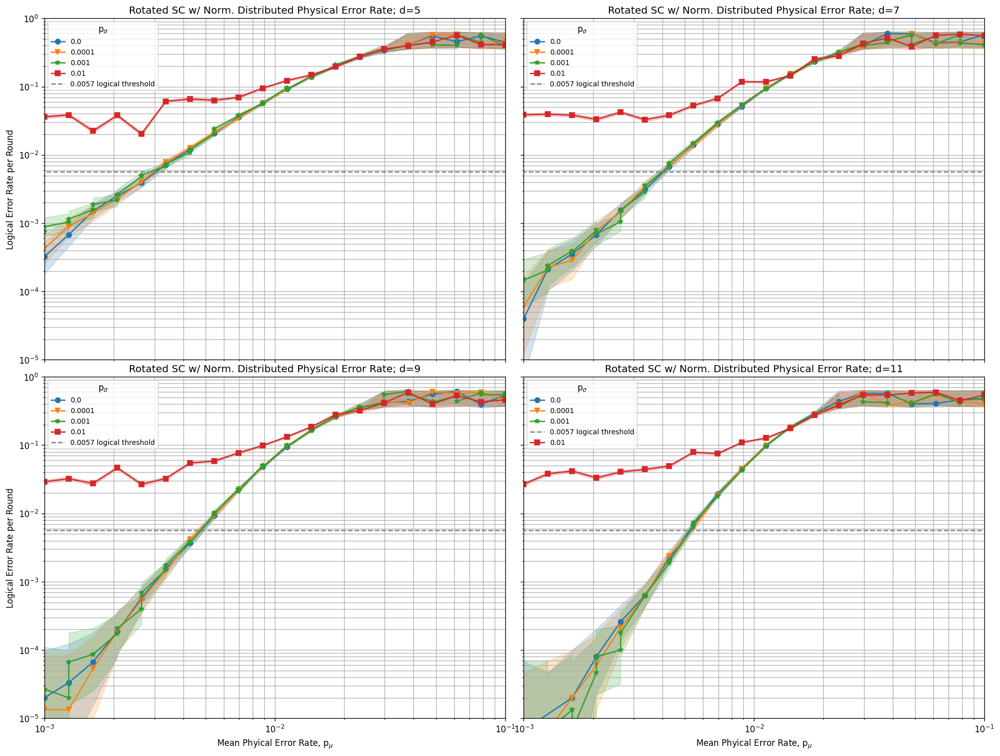

In [84]:
multi_distances_sc_mean_dist_plot(collected_m_1, use_loglog=True, p_thr=0.0057)

In [85]:
p_sigma_values = [0.0, 0.001, 0.005, .001, .0015, 0.01]
collected_m_2 = multi_distance_sc_mean_dist_sinter(distances, p_sigma_values, rounds)

Starting 12 workers...
120 tasks left:
  workers    decoder eta shots_left errors_seen json_metadata                                                            
        1 pymatching   ?      50000           0 p_mu=0.001,p_sigma=0.0,rounds=3,distance=5,p_mu_range=[0.001, 0.1]       
        1 pymatching <1m      47679           8 p_mu=0.001,p_sigma=0.001,rounds=3,distance=5,p_mu_range=[0.001, 0.1]     
        1 pymatching   ?      50000           0 p_mu=0.001,p_sigma=0.005,rounds=3,distance=5,p_mu_range=[0.001, 0.1]     
        1 pymatching   ?      50000           0 p_mu=0.001,p_sigma=0.001,rounds=3,distance=5,p_mu_range=[0.001, 0.1]     
        1 pymatching   ?      50000           0 p_mu=0.001,p_sigma=0.0015,rounds=3,distance=5,p_mu_range=[0.001, 0.1]    
        1 pymatching   ?      50000           0 p_mu=0.001,p_sigma=0.01,rounds=3,distance=5,p_mu_range=[0.001, 0.1]      
        1 pymatching   ?      50000           0 p_mu=0.0012743,p_sigma=0.0,rounds=3,distance=5,p_mu_range=[

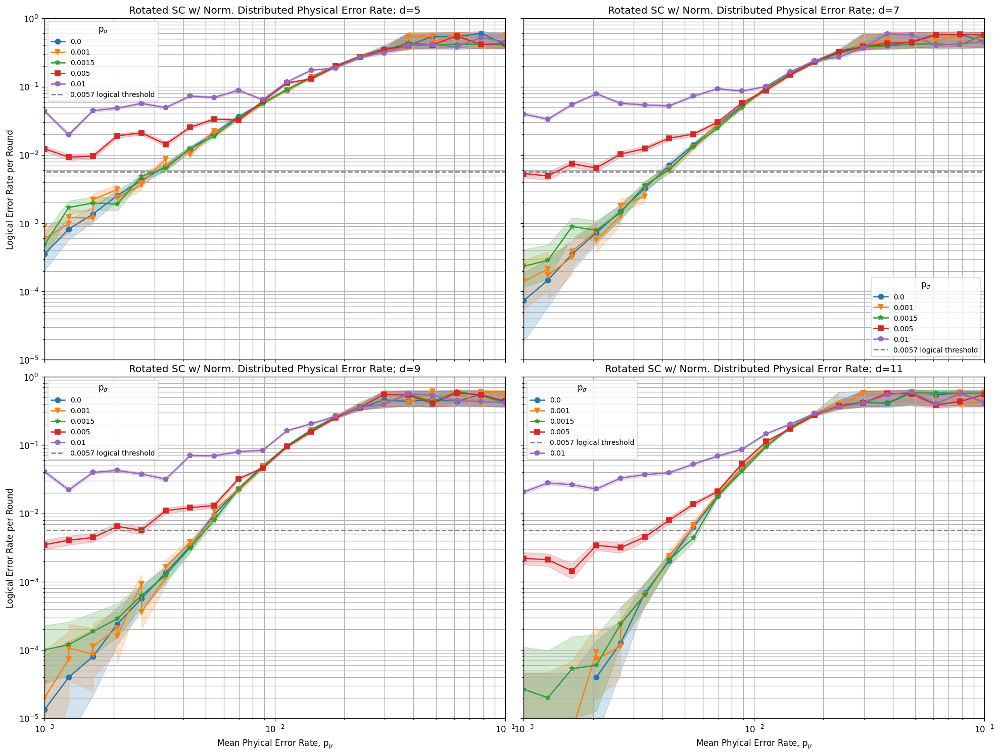

In [ ]:
multi_distances_sc_mean_dist_plot(collected_m_2, use_loglog=True)

In [60]:
p_sigma_values = [0.0, 0.005, .007, .009, 0.011]
collected_m_3 = multi_distance_sc_mean_dist_sinter(distances, p_sigma_values, rounds)

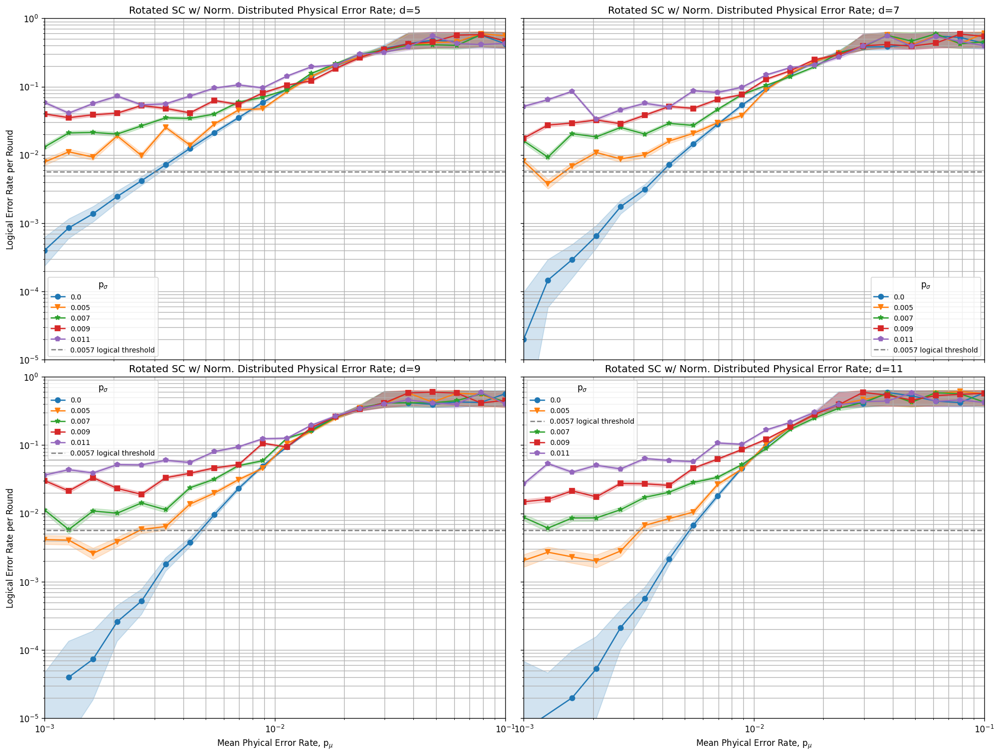

In [61]:
multi_distances_sc_mean_dist_plot(collected_m_3, use_loglog=True)

In [62]:
p_sigma_values = [0.0, 0.005, .007, .009, 0.011]
distances = [3, 5, 7, 9, 11, 13, 15, 17]
collected_m_4 = multi_distance_sc_mean_dist_sinter(distances, p_sigma_values, rounds)

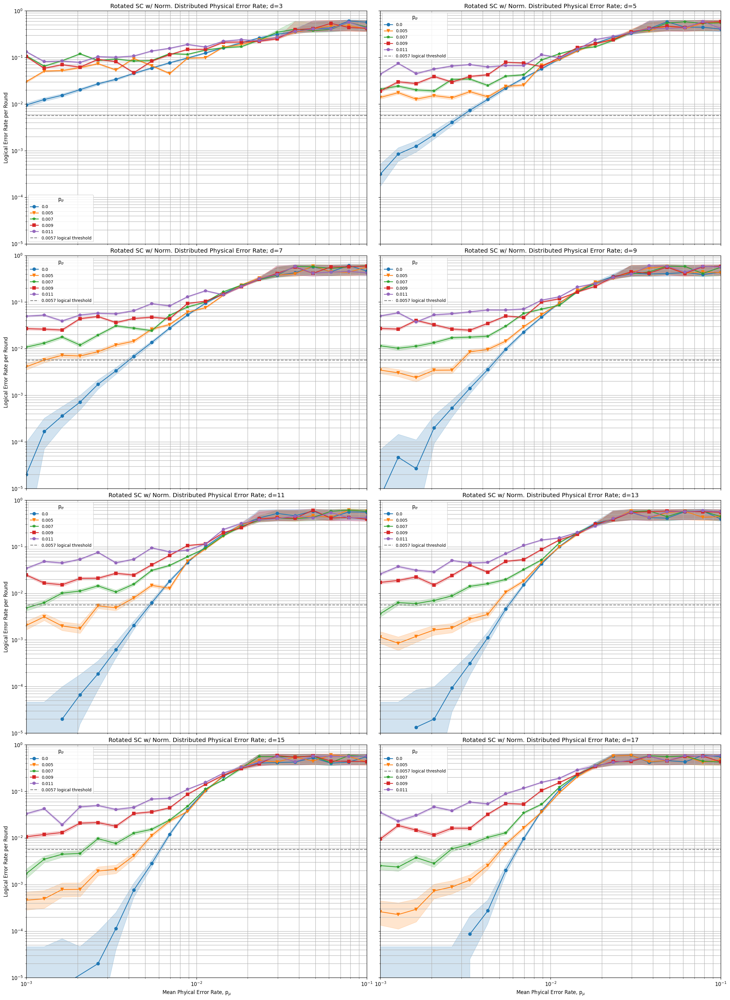

In [74]:
multi_distances_sc_mean_dist_plot(collected_m_4, use_loglog=True)

## Defect Experiments ##

In [46]:
distances = [5, 7, 9, 11]
rounds = 3

In [ ]:
p_defect_values = [0.01, 0.05, 0.10, 0.15, 0.20, 0.3]
defect_type = 'center'
collected_d_1 = multi_distance_sc_defect_sinter(distances, p_defect_values, defect_type_str='center', rounds = rounds)

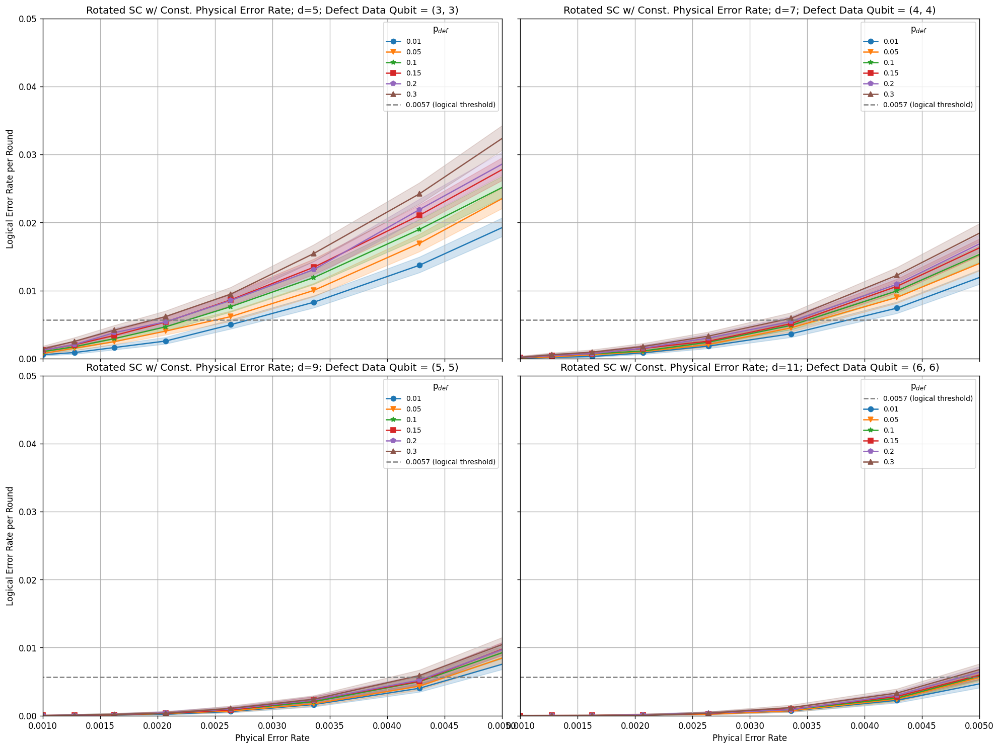

In [ ]:
multi_distances_sc_defect_plot(collected_d_1, use_loglog=False, p_thr=0.0057)

In [52]:
p_defect_values = [0.01, 0.05, 0.10, 0.15, 0.20, 0.3]
defect_type = 'measure-center'
collected_d_2 = multi_distance_sc_defect_sinter(distances, p_defect_values, defect_type_str=defect_type, rounds = rounds)

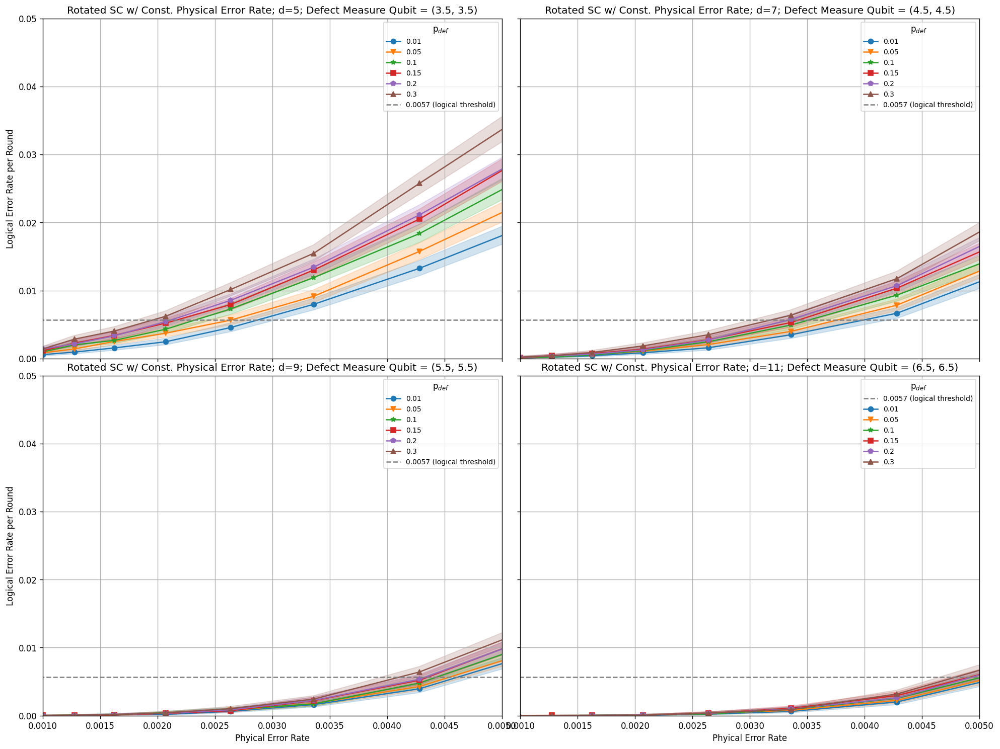

In [53]:
multi_distances_sc_defect_plot(collected_d_2, use_loglog=False)

In [54]:
p_defect_values = [0.01, 0.05, 0.10, 0.15, 0.20, 0.3]
defect_type = 'edge'
collected_d_3 = multi_distance_sc_defect_sinter(distances, p_defect_values, defect_type_str=defect_type, rounds = rounds)

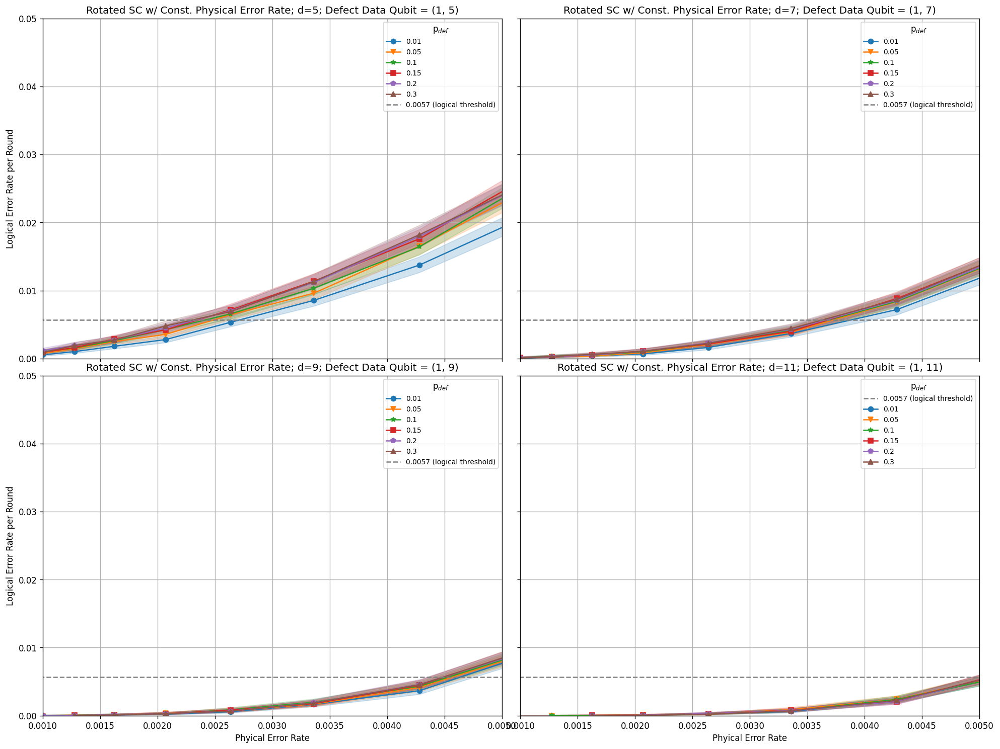

In [55]:
multi_distances_sc_defect_plot(collected_d_3, use_loglog=False)

In [56]:
p_defect_values = [0.01, 0.05, 0.10, 0.15, 0.20, 0.3]
defect_type = 'measure-edge'
collected_d_4 = multi_distance_sc_defect_sinter(distances, p_defect_values, defect_type_str=defect_type, rounds = rounds)

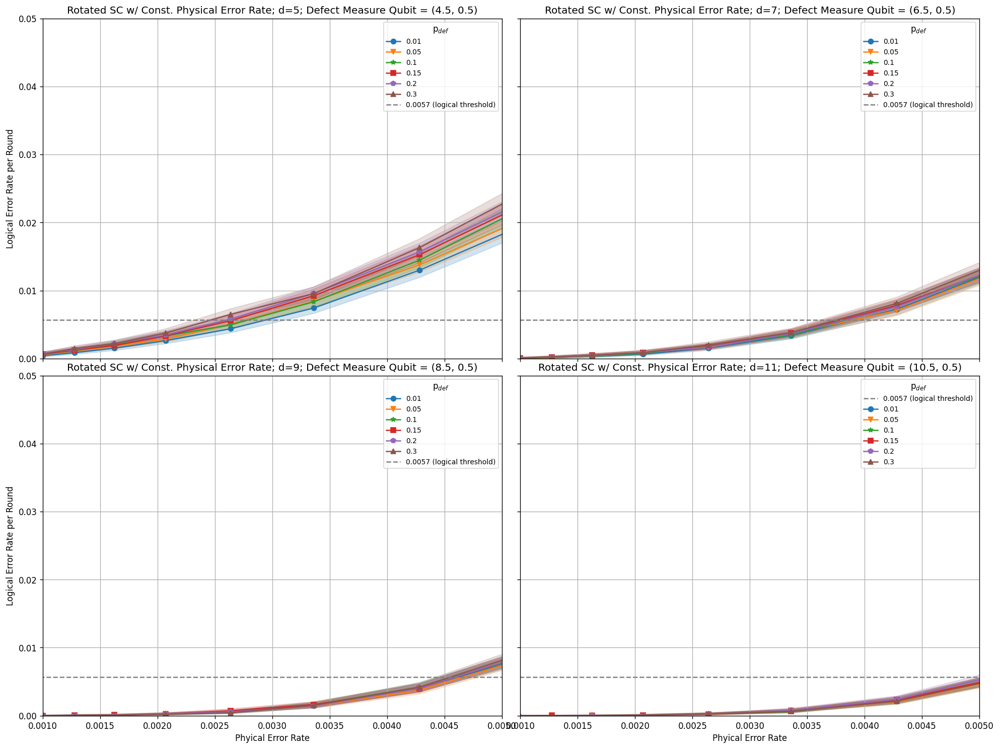

In [57]:
multi_distances_sc_defect_plot(collected_d_4, use_loglog=False)